### #0 importando arquivos

In [56]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import figure

### #1 Ler o arquivo

In [57]:
df1 = pd.read_csv("../data/raw/raw_turbina_scala.csv")

df1.columns = ["Data/hora", "ActivePower (kW)", "Wind Speed (m/s)", "CurvaTeórica (KWh)", "DireçãoVento (°)"]
del df1["DireçãoVento (°)"]
df1["Data/hora"] = pd.to_datetime(df1["Data/hora"], format="%d %m %Y %H:%M")

display(df1)

,Data/hora,ActivePower (kW),Wind Speed (m/s),CurvaTeórica (KWh)
0,2018-01-01 00:00:00,380.047791,5.311336,416.328908
1,2018-01-01 00:10:00,453.769196,5.672167,519.917511
2,2018-01-01 00:20:00,306.376587,5.216037,390.900016
3,2018-01-01 00:30:00,419.645905,5.659674,516.127569
4,2018-01-01 00:40:00,380.650696,5.577941,491.702972
...,...,...,...,...
50525,2018-12-31 23:10:00,2963.980957,11.404030,3397.190793
50526,2018-12-31 23:20:00,1684.353027,7.332648,1173.055771
50527,2018-12-31 23:30:00,2201.106934,8.435358,1788.284755
50528,2018-12-31 23:40:00,2515.694092,9.421366,2418.382503


### #2 Plotando os dados em um gráfico - Real

<Axes: xlabel='Wind Speed (m/s)', ylabel='ActivePower (kW)'>

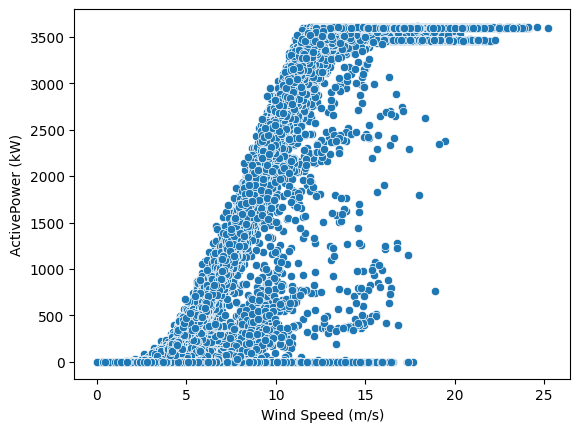

In [58]:
sns.scatterplot(data=df1, x="Wind Speed (m/s)", y="ActivePower (kW)")

### #3 Plotando os dados em um gráfico - Teórica

<Axes: xlabel='Wind Speed (m/s)', ylabel='CurvaTeórica (KWh)'>

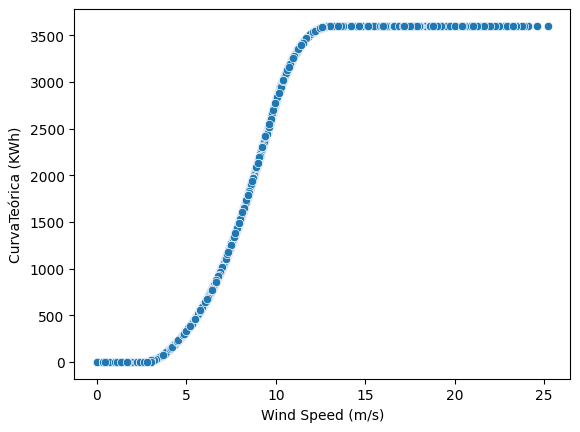

In [59]:
sns.scatterplot(data=df1, x="Wind Speed (m/s)", y="CurvaTeórica (KWh)")

### #4 Criando "limites aceitaveis"

In [60]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

In [61]:
pot_real = df1["ActivePower (kW)"].tolist()
pot_teorica = df1["CurvaTeórica (KWh)"].tolist()
pot_max = []
pot_min = []
limite = []
df_limite = pd.DataFrame({'pot_real': pot_real, 'pot_teorica': pot_teorica})

In [62]:
# Dividir os dados em conjuntos de treino e teste
X = df_limite[['pot_real']]  # Feature: potência real
y = df_limite['pot_teorica']  # Target: potência teórica

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Treinar um modelo de regressão linear simples
model = LinearRegression()
model.fit(X_train, y_train)

# Avaliar o modelo nos dados de teste
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'MSE: {mse}')

MSE: 189916.17068458727


In [63]:
for index, row in df_limite.iterrows():
    pot_real = row['pot_real']
    pot_teorica_pred = model.predict([[pot_real]])[0]
    
    pot_max = pot_teorica_pred * 1.05
    pot_min = pot_teorica_pred * 0.95
    
    if pot_real >= pot_min and pot_real <= pot_max:
        limite.append("Dentro")
    elif pot_real == 0:
        limite.append("Zero")
    else:
        limite.append("Fora")


c:\Users\vmore\Desktop\PROEJTOS\PROJETOS GIT\analytics-turbina-eolica\venv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\vmore\Desktop\PROEJTOS\PROJETOS GIT\analytics-turbina-eolica\venv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\vmore\Desktop\PROEJTOS\PROJETOS GIT\analytics-turbina-eolica\venv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\vmore\Desktop\PROEJTOS\PROJETOS GIT\analytics-turbina-eolica\venv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\vmore\Desktop\PROEJTOS\PROJETOS GIT\analytics-turbina-eolica\ve

### #5 Adicionando coluna "limite" ao Dataframe

In [67]:
df1["LimiteOperacional"] = limite
display(df1)

,Data/hora,ActivePower (kW),Wind Speed (m/s),CurvaTeórica (KWh),LimiteOperacional
0,2018-01-01 00:00:00,380.047791,5.311336,416.328908,Fora
1,2018-01-01 00:10:00,453.769196,5.672167,519.917511,Fora
2,2018-01-01 00:20:00,306.376587,5.216037,390.900016,Fora
3,2018-01-01 00:30:00,419.645905,5.659674,516.127569,Fora
4,2018-01-01 00:40:00,380.650696,5.577941,491.702972,Fora
...,...,...,...,...,...
50525,2018-12-31 23:10:00,2963.980957,11.404030,3397.190793,Fora
50526,2018-12-31 23:20:00,1684.353027,7.332648,1173.055771,Fora
50527,2018-12-31 23:30:00,2201.106934,8.435358,1788.284755,Fora
50528,2018-12-31 23:40:00,2515.694092,9.421366,2418.382503,Fora


### #6 Plotando novamente o gráfico

<Axes: xlabel='Wind Speed (m/s)', ylabel='ActivePower (kW)'>

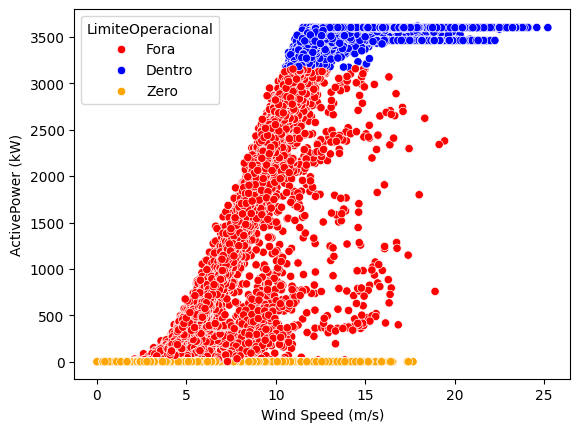

In [65]:
cores = {"Dentro": 'blue', "Fora": "red", "Zero": "orange"}
sns.scatterplot(data=df1, x="Wind Speed (m/s)", y="ActivePower (kW)", hue="LimiteOperacional", palette=cores)